In [2]:
"""
Preparation
"""

import cv2 as cv
import os
from matplotlib import pyplot as plt
import numpy as np
import utils
import dotenv
import joblib

dotenv.load_dotenv(dotenv.find_dotenv())
SH_CLIENT_ID = os.environ.get("SH_CLIENT_ID", "")
SH_CLIENT_SECRET = os.environ.get("SH_CLIENT_SECRET", "")
BASE_DIR = os.getcwd()
SEQ_DIR = os.path.join(os.getcwd(), "assets/real_data_1")
SEQ_SIZE = 122
OUTPUT_IMAGES_DIR = os.path.join(BASE_DIR, "output_images")
EOLEARN_CACHE_FOLDER = os.path.join(BASE_DIR, ".eolearn_cache")

def print_cv_images(array, fig_weight, fig_height):
    if (len(array) < 2):
        raise ValueError
    table_height = len(array)
    table_weight = len(array[0])
    fig, table = plt.subplots(table_height, table_weight)
    fig.set_size_inches(fig_weight, fig_height)
    for row in range(table_height):
        for col in range(table_weight):
            table[row][col].imshow(cv.cvtColor(
                array[row][col],
                cv.COLOR_BGR2RGB), 
            )

def get_file_number(n, k):
    res = str(n)
    while(len(res) < k):
        res = "0" + res
    return res

In [4]:
with open(os.path.join(OUTPUT_IMAGES_DIR, "mask_save.npy"), "rb") as f:
    mask = np.load(f)
DELTA = 0
cnt = np.zeros(mask.shape[1:], dtype=np.uint16)
res = []
for i in range(SEQ_SIZE - 1, -1, -1):
    cnt += ~mask[i]
    res.append(cnt <= DELTA)
    # res.append(cv.cvtColor(np.uint8(cnt <= DELTA) * 255, v.COLOR_GRAY2RGB))
res = np.array(res[::-1])
print(res.shape)

utils.show_images(utils.images_to_rgb_mask(res[-6:]), fig_size=(25, 5))

FileNotFoundError: [Errno 2] No such file or directory: 'C:\\Users\\gronn\\Documents\\github_research_tree_evolution\\research-tree-evolution\\output_images\\mask_save.npy'

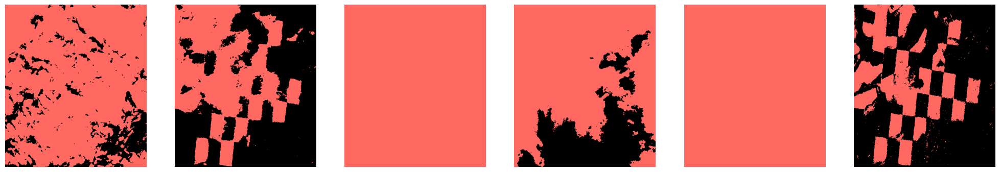

In [7]:
with open(os.path.join(OUTPUT_IMAGES_DIR, "mask_save.npy"), "rb") as f:
    mask = np.load(f)
utils.show_images(utils.images_to_rgb_mask(mask[-6:]), fig_size=(25, 5))

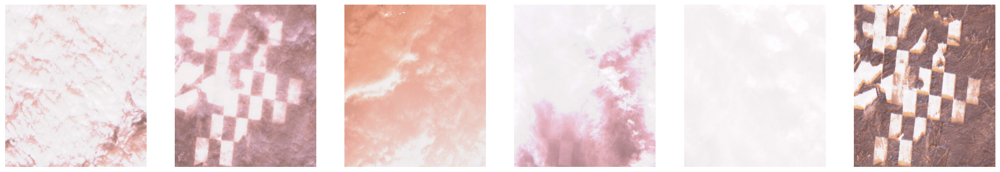

In [4]:
images = []
for frame in range(SEQ_SIZE):
    images.append(cv.imread(os.path.join(SEQ_DIR, f"image_{frame}.png")))
utils.show_images(np.array(images[-6:]), fig_size=(25, 5))

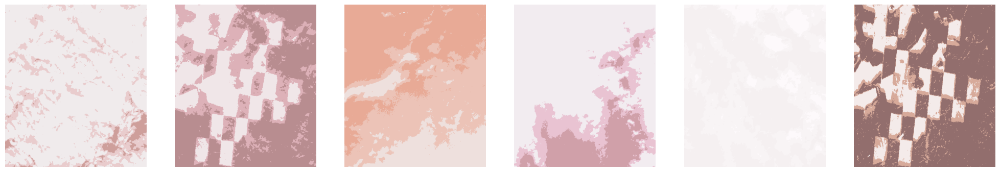

In [2]:
images_to_process = []
for frame in range(SEQ_SIZE):
    images_to_process.append(cv.imread(os.path.join(SEQ_DIR, f"image_{frame}.png")))
final_images = utils.process_images(np.array(images_to_process))
utils.show_images(final_images[-6:], fig_size=(25, 5))
with open(os.path.join(OUTPUT_IMAGES_DIR, "mask_save.npy"), "wb") as f:
    np.save(f, final_images)

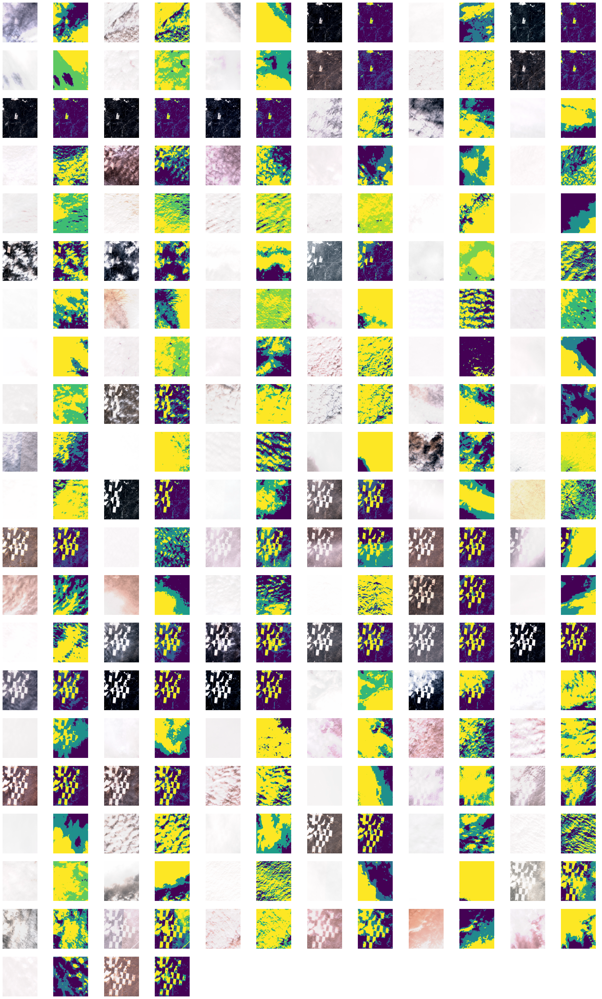

In [3]:
with open(os.path.join(OUTPUT_IMAGES_DIR, "mask_save.npy"), "rb") as f:
    mask = np.load(f)
images = []
for frame in range(SEQ_SIZE):
    images.append(cv.imread(os.path.join(SEQ_DIR, f"image_{frame}.png")))
images = np.array(images)
res = []
for i in range(SEQ_SIZE):
    res.append(images[i])
    res.append(mask[i])
utils.show_images(res, fig_size=(30, 50), row_size=12)

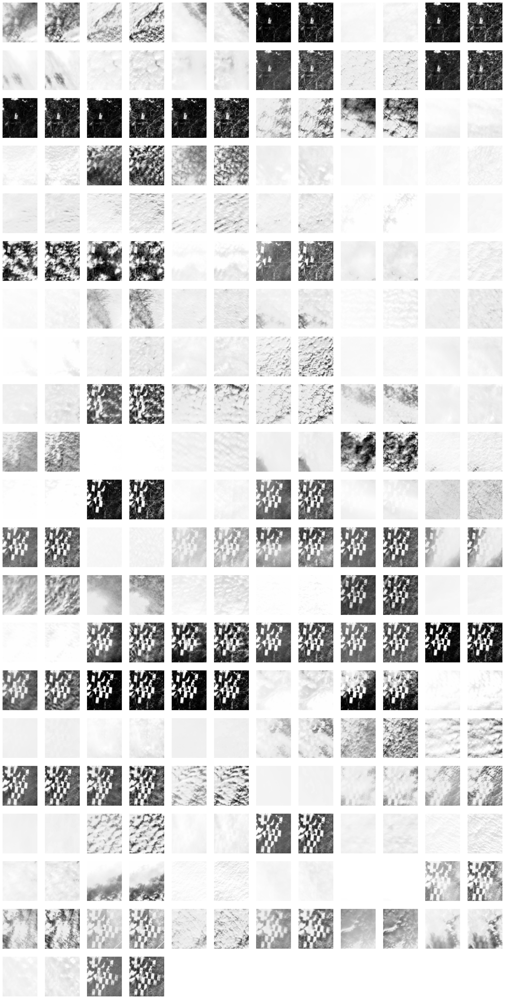

In [7]:
images = []
for frame in range(SEQ_SIZE):
    cur_image = cv.imread(os.path.join(SEQ_DIR, f"image_{frame}.png"))
    new_image = cv.blur(cv.cvtColor(cur_image, cv.COLOR_BGR2GRAY), (9, 9))
    clahe = cv.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    images.append(cv.cvtColor(new_image, cv.COLOR_GRAY2RGB))
    images.append(cv.cvtColor(clahe.apply(new_image), cv.COLOR_GRAY2RGB))
images = np.array(images)
utils.show_images(images, fig_size=(25, 50), row_size=12)

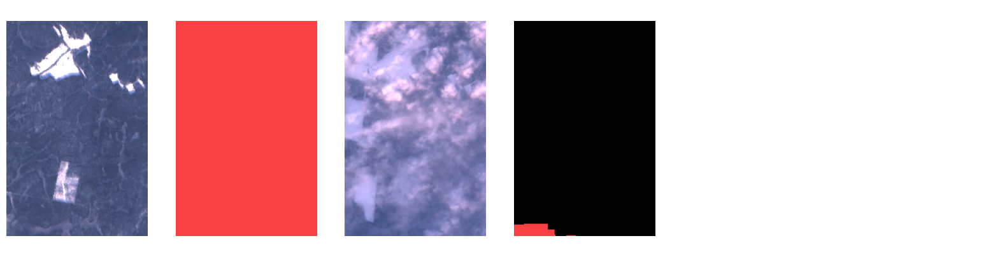

In [13]:
comclient = utils.CommunicationClient(
    sh_client_id=SH_CLIENT_ID,
    sh_client_secret=SH_CLIENT_SECRET,
    cache_folder=EOLEARN_CACHE_FOLDER,
)
coords = (
    42.67107,
    59.59354,
    42.72840,
    59.54539,
)
import datetime
time_intervals = [
    (
        datetime.date(2018, 2, 8),
        datetime.date(2018, 2, 8),
    ),
    (
        datetime.date(2019, 1, 19),
        datetime.date(2019, 1, 19),
    ),
]
data = comclient.get_data_mtp(
    coords=coords,
    time_interval=time_intervals,
    resolution=20,
)
images_to_show = []
for tc, mask, im_date in data:
    images_to_show.append(tc)
    images_to_show.append(
        utils.cluster_array_to_image(mask),
    )
utils.show_images(images_to_show, fig_size=(20, 5))

145 (207, 157, 3)


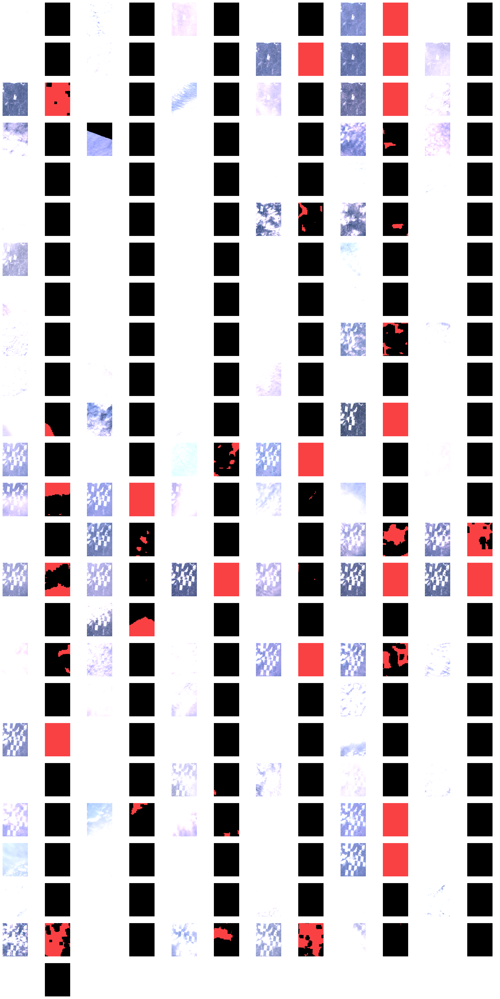

In [3]:
comclient = utils.CommunicationClient(
    sh_client_id=SH_CLIENT_ID,
    sh_client_secret=SH_CLIENT_SECRET,
    cache_folder=EOLEARN_CACHE_FOLDER,
)
coords = (
    42.65614,
    59.58242,
    42.73579,
    59.52529,
)
import datetime
time_intervals = [
    (
        datetime.date(2017, 12, 1),
        datetime.date(2018, 2, 28),
    ),
    (
        datetime.date(2018, 12, 1),
        datetime.date(2019, 2, 28),
    ),
    (
        datetime.date(2019, 12, 1),
        datetime.date(2020, 2, 29),
    ),
    (
        datetime.date(2020, 12, 1),
        datetime.date(2021, 2, 28),
    ),
    (
        datetime.date(2021, 12, 1),
        datetime.date(2022, 2, 28),
    ),
    (
        datetime.date(2022, 12, 1),
        datetime.date(2023, 2, 28),
    ),
]
data = comclient.get_data_mtp(
    coords=coords,
    time_intervals=time_intervals,
    resolution=30,
)
print(len(data), data[0][0].shape)
joblib.dump(data, os.path.join(SEQ_DIR, "data_save.sav"))
images_to_show = []
for tc, mask, im_date in data:
    images_to_show.append(tc)
    images_to_show.append(
        utils.cluster_array_to_image(mask),
    )
utils.show_images(images_to_show, fig_size=(25, 50), row_size=12)

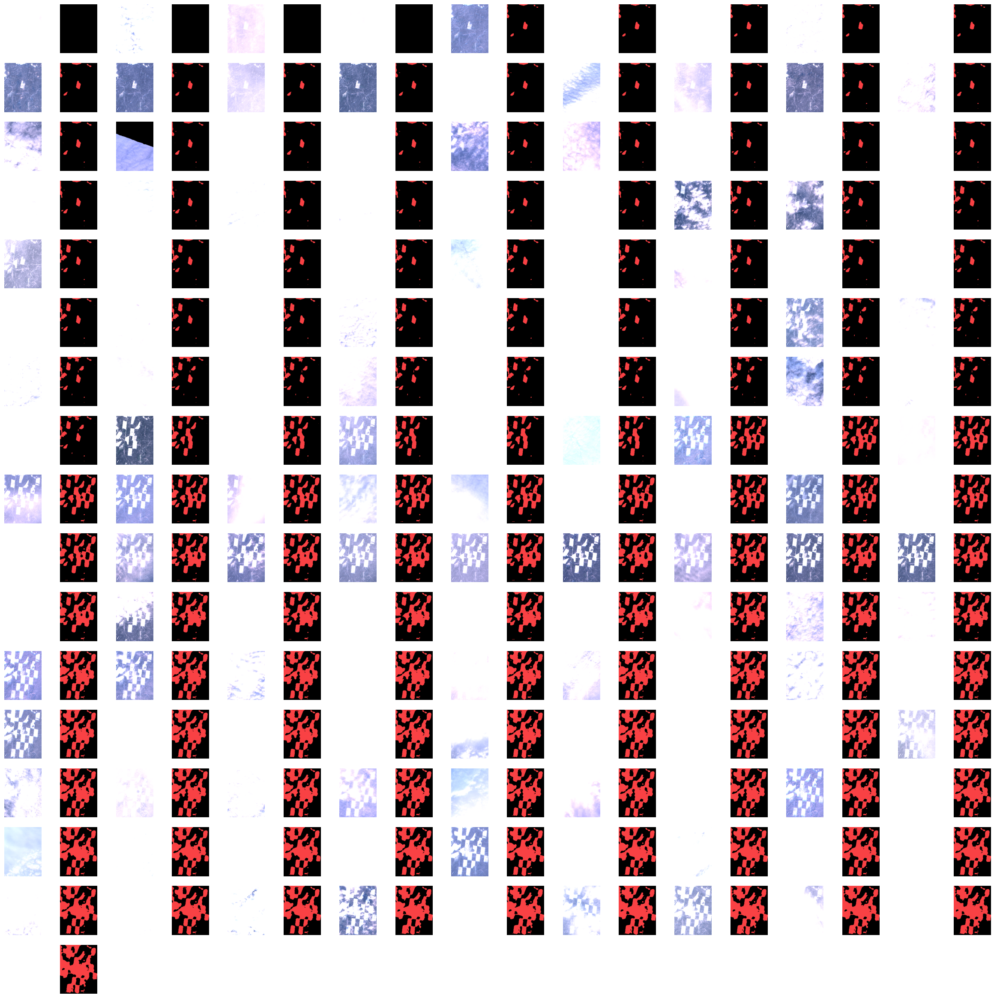

In [22]:
data = joblib.load(os.path.join(SEQ_DIR, "data_save.sav"))

def get_gray_scale(a): #rgb
    return np.round(
        0.299 * a[0] + 0.587 * a[1] + 0.114 * a[2],
    )

def gray_pixel_dist(a, b):
    return abs(get_gray_scale(a) - get_gray_scale(b))

def process_pair(image, mask):
    k = 2
    d = 20
    blured_image = cv.medianBlur(image, 9)
    line_element = np.zeros(image.shape[:2], dtype=np.uint32)
    res_image = np.zeros(image.shape[:2], dtype=bool)
    image_line = []
    for x in range(image.shape[0]):
        for y in range(image.shape[1]):
            if mask[x, y][0]:
                line_element[x, y] = len(image_line)
                image_line.append(np.float32(blured_image[x, y]))
    image_line = np.array(image_line)
    if len(image_line) == 0:
        return res_image
    criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 20, 0.5)
    comp, labels, centers = cv.kmeans(
        image_line,
        k,
        None,
        criteria,
        20,
        cv.KMEANS_RANDOM_CENTERS,
    )
    gray_centers = np.zeros(k, dtype=np.float32)
    for i in range(len(centers)):
        gray_centers[i] = get_gray_scale(np.uint8(centers[i]))
    truth_center = max(gray_centers)
    if abs(gray_centers[0] - gray_centers[1]) < d:
        return res_image
    line_res = gray_centers[labels.flatten()]
    for x in range(image.shape[0]):
        for y in range(image.shape[1]):
            if mask[x, y][0] and line_res[line_element[x, y]] == truth_center:
                res_image[x, y] = True
    return res_image

final_masks = []
images_to_show = []
for tc, mask, _ in data:
    cur_mask = utils.cluster_array_to_image(
        process_pair(tc, mask),
    )
    if len(final_masks) > 0:
        cur_mask |= final_masks[-1]
    final_masks.append(cur_mask)
    images_to_show.append(tc)
    images_to_show.append(final_masks[-1])
    

utils.show_images(images_to_show, fig_size=(30, 30), row_size=18)
    